In [1]:
import numpy as np

from prospect.specutils import Spectra
from prospect import viewer

from IPython.display import clear_output

import matplotlib 
import matplotlib.pyplot as plt
import matplotlib.image as img
from matplotlib.pyplot import rc
%matplotlib inline

from astropy.convolution import convolve, Gaussian1DKernel

import pickle
plt.rcParams['font.size'] = 14

In [2]:
with open("/pscratch/sd/j/juikuan/DESI_LAE_dataset/original_dataset/fuji_pre_lite.pkl", "rb") as fh:
    spectra = pickle.load(fh)

In [3]:
def inspector(spectra, label_path, TARGETID = None):
    with open(label_path, "rb") as fh:
        labels = pickle.load(fh)
    n = 0
    for i in range(0, len(spectra)):
        spectrum = spectra[i]
        label = labels[i]
        if spectrum["TARGETID"] != label["TARGETID"]:
            print(f"Inconsistent targetid at {i}")
            break
        else:
            pass
        n += 1
        if "VI" not in label:
            label["VI"] = []
        else:
            pass
        
        if len(label["VI"]) == 0:
            pass
        else:
            if TARGETID != None:
                pass
            else:
                continue
            
        flux = spectrum["FLUX"]
        wavelength = spectrum["WAVE"]
        redshift = spectrum["Z"]
        ivar = spectrum["IVAR"]
        targetid = spectrum["TARGETID"]

        if TARGETID != None:
            if targetid == TARGETID:
                pass
            else:
                continue
        print(f"No.{n} / {len(spectra)}")
        
        if redshift > 1.96:
            vlines = np.array([1215.67, 1549, 1908, 2796]) * (redshift  + 1)
            #Lya, CIV, CIII, and MGII

        elif redshift < 0.4:
            vlines = np.array([3726.032, 3968.47, 4101.734, 4340, 4861, 5007, 4959, 6562.81]) * (redshift  + 1)
            #OII, HEPSILON, HDELTA, HGAMMA, HBETA, OIII, and HALPHA
        else:
            pass

        vlines = vlines[vlines < wavelength[-1]]
        vlines = vlines[vlines > wavelength[0]]

        w = wavelength
        f = flux
        iv = np.sqrt(ivar) ** -1

        plt.close()
        plt.rcParams['figure.figsize'] = (32,8)
        plt.title(f"target ID = {targetid}\n"
                  f"Redshift = {redshift}\n", loc = 'left')
        plt.xlabel('$\lambda\ [\AA]$')
        plt.ylabel('$f_{\lambda}$ $(10^{-17}$ $erg$ $s^{-1}$ $cm^{-2}$ $\AA^{-1})$')
        plt.plot(w, convolve(f, Gaussian1DKernel(2)), color = 'k', label = 'Smoothed spectrum', lw = 1)
        plt.plot(w, convolve(iv, Gaussian1DKernel(2)), color = 'orange', alpha = 0.5, label = 'noise', lw = 1)
        ymax = np.std(f, ddof = 1) * 7
        ymin = -np.std(f, ddof = 1) * 7
        plt.xlim(3500, 9900)
        plt.ylim(ymin, ymax)

        for j in vlines:
            plt.vlines(x = j, ymin = ymin, ymax = ymax, color = "b", linestyles = "dashed", lw = 1)

        plt.legend()
        plt.savefig("/global/homes/j/juikuan/DESI_LAE/test.png", bbox_inches='tight')
        plt.show()

        if redshift < 0.4:
            mask_min = wavelength > 3726.032 * (redshift + 1) - 50
            mask_max = wavelength < 3726.032 * (redshift + 1) + 50
            w = wavelength[mask_min & mask_max]
            f = flux[mask_min & mask_max]
            iv = np.sqrt(ivar[mask_min & mask_max]) ** -1

            if np.max(f) == np.inf:
                f[np.where(f == np.inf)] = np.median(f)
            elif np.max(iv) == np.inf:
                iv[np.where(iv == np.inf)] = np.median(iv)
            else:
                pass

            plt.rcParams['figure.figsize'] = (7, 4)
            plt.plot(w, f, color = 'k', alpha = 1, label = 'Unsmoothed spectrum')
            plt.plot(w, iv, color = 'orange', alpha = 0.7, label = 'noise')
            plt.hlines(y = 0, xmin = 3726.032 * (redshift + 1) - 50, xmax = 3726.032 * (redshift + 1) + 50)
            plt.show()

        elif redshift > 1.96:
            mask_min = wavelength > 1215.67 * (redshift + 1) - 50
            mask_max = wavelength < 1215.67 * (redshift + 1) + 50
            w = wavelength[mask_min & mask_max]
            f = flux[mask_min & mask_max]
            iv = np.sqrt(ivar[mask_min & mask_max]) ** -1

            if np.max(f) == np.inf:
                f[np.where(f == np.inf)] = np.median(f)
            elif np.max(iv) == np.inf:
                iv[np.where(iv == np.inf)] = np.median(iv)
            else:
                pass

            plt.rcParams['figure.figsize'] = (7,4)
            plt.plot(w, f, color = 'k', alpha = 1, label = 'Unsmoothed spectrum')
            plt.plot(w, iv, color = 'orange', alpha = 0.7, label = 'noise')
            plt.hlines(y = 0, xmin = 1215.67 * (redshift + 1) - 50, xmax = 1215.67 * (redshift + 1) + 50)
            plt.show()

        print("Is it a LAE?")
        print(f"https://www.legacysurvey.org/viewer-desi/desi-spectrum/dr1/targetid{targetid}")
        again = True
        exit = False
        while again:
            try:
                answer1 = input("None:Skip / 0:Exit / 1:LAE / 2:NLAE / 3:Other")
                if answer1 == "":
                    pass
                elif int(answer1) == 0:
                    exit = True
                    break
                elif int(answer1) == 1:
                    label["VI"].append("LAE")
                elif int(answer1) == 2:
                    label["VI"].append("NLAE")
                elif int(answer1) == 3:
                    label["VI"].append("Other")
                again = False
                clear_output()
            except:
                print("Only None, 0, 1, 2, and 3 are legal!")

        if exit == True:
            break
        else:
            pass
        if n % 5 == 0:
            with open(label_path, "wb") as fh:
                pickle.dump(labels, fh)
            print("Haved been saved to the pkl file!")
        else:
            pass
        print("===============================================================================================================================")
    with open(label_path, "wb") as fh:
        pickle.dump(labels, fh)
    print("Haved been saved to the pkl file!")
    return labels

In [10]:
def plot_spectra(spectra, TARGETID = None):
    for i in range(0, len(spectra)):
        spectrum = spectra[i]
        flux = spectrum["FLUX"]
        wavelength = spectrum["WAVE"]
        redshift = spectrum["Z"]
        ivar = spectrum["IVAR"]
        targetid = spectrum["TARGETID"]

        if TARGETID != None:
            if targetid in TARGETID:
                pass
            else:
                continue

        if redshift > 1.96:
            vlines = np.array([1215.67, 1549, 1908, 2796]) * (redshift  + 1)
            #Lya, CIV, CIII, and MGII

        elif redshift < 0.4:
            vlines = np.array([3726.032, 3968.47, 4101.734, 4340, 4861, 5007, 4959, 6562.81]) * (redshift  + 1)
            #OII, HEPSILON, HDELTA, HGAMMA, HBETA, OIII, and HALPHA
        else:
            pass

        vlines = vlines[vlines < wavelength[-1]]
        vlines = vlines[vlines > wavelength[0]]

        w = wavelength
        f = flux
        iv = np.sqrt(ivar) ** -1

        plt.close()
        plt.rcParams['figure.figsize'] = (32,8)
        plt.title(f"target ID = {targetid}\n"
                  f"Redshift = {redshift}\n", loc = 'left')
        plt.xlabel('$\lambda\ [\AA]$')
        plt.ylabel('$f_{\lambda}$ $(10^{-17}$ $erg$ $s^{-1}$ $cm^{-2}$ $\AA^{-1})$')
        plt.plot(w, convolve(f, Gaussian1DKernel(2)), color = 'k', label = 'Smoothed spectrum', lw = 1)
        plt.plot(w, convolve(iv, Gaussian1DKernel(2)), color = 'orange', alpha = 0.5, label = 'noise', lw = 1)
        ymax = np.std(f, ddof = 1) * 7
        ymin = -np.std(f, ddof = 1) * 7
        plt.xlim(3500, 9900)
        plt.ylim(ymin, ymax)

        for j in vlines:
            plt.vlines(x = j, ymin = ymin, ymax = ymax, color = "b", linestyles = "dashed", lw = 1)

        plt.legend()
        plt.savefig("/global/homes/j/juikuan/DESI_LAE/test.png", bbox_inches='tight')
        plt.show()

        if redshift < 0.4:
            mask_min = wavelength > 3726.032 * (redshift + 1) - 50
            mask_max = wavelength < 3726.032 * (redshift + 1) + 50
            w = wavelength[mask_min & mask_max]
            f = flux[mask_min & mask_max]
            iv = np.sqrt(ivar[mask_min & mask_max]) ** -1

            if np.max(f) == np.inf:
                f[np.where(f == np.inf)] = np.median(f)
            elif np.max(iv) == np.inf:
                iv[np.where(iv == np.inf)] = np.median(iv)
            else:
                pass

            plt.rcParams['figure.figsize'] = (7, 4)
            plt.plot(w, f, color = 'k', alpha = 1, label = 'Unsmoothed spectrum')
            plt.plot(w, iv, color = 'orange', alpha = 0.7, label = 'noise')
            plt.hlines(y = 0, xmin = 3726.032 * (redshift + 1) - 50, xmax = 3726.032 * (redshift + 1) + 50)
            plt.show()

        elif redshift > 1.96:
            mask_min = wavelength > 1215.67 * (redshift + 1) - 50
            mask_max = wavelength < 1215.67 * (redshift + 1) + 50
            w = wavelength[mask_min & mask_max]
            f = flux[mask_min & mask_max]
            iv = np.sqrt(ivar[mask_min & mask_max]) ** -1

            if np.max(f) == np.inf:
                f[np.where(f == np.inf)] = np.median(f)
            elif np.max(iv) == np.inf:
                iv[np.where(iv == np.inf)] = np.median(iv)
            else:
                pass

            plt.rcParams['figure.figsize'] = (7,4)
            plt.plot(w, f, color = 'k', alpha = 1, label = 'Unsmoothed spectrum')
            plt.plot(w, iv, color = 'orange', alpha = 0.7, label = 'noise')
            plt.hlines(y = 0, xmin = 1215.67 * (redshift + 1) - 50, xmax = 1215.67 * (redshift + 1) + 50)
            plt.show()

In [5]:
def display_image_in_actual_size(im_path):

    dpi = 80
    im_data = plt.imread(im_path)
    height, width, depth = im_data.shape

    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)

    # Hide spines, ticks, etc.
    plt.axis('off')

    # Display the image.
    plt.imshow(im_data)

    plt.show()

In [6]:
def inspector_image(label_path, profile):
    with open(label_path, "rb") as fh:
        labels = pickle.load(fh)
    n = 0
    for i in range(0, len(labels)):
        label = labels[::-1][i]
        n += 1
        if "VI" not in label:
            label["VI"] = []
        else:
            pass
        
        if len(label["VI"]) == 0:
            pass
        else:
            continue
            
        if profile != None:
            if len(label["PROFILE"]) != 0:
                if profile == label["PROFILE"][-1]:
                    pass
                else:
                    continue
        else:
            pass
        
        print(f"No.{n} / {len(spectra)}")
        display_image_in_actual_size(f'/pscratch/sd/j/juikuan/DESI_LAE_dataset/original_dataset/iron_pre_spectra/{label["TARGETID"]}.png')
        display_image_in_actual_size(f'/pscratch/sd/j/juikuan/DESI_LAE_dataset/original_dataset/iron_pre_spectra/{label["TARGETID"]}_s.png')
        if len(label["PROFILE"]) != 0:
            print(label["PROFILE"][-1])
        again = True
        exit = False
        while again:
            try:
                answer1 = input("None:Skip / 0:Exit / 7:LAE / 8:NLAE / 9:Other")
                if answer1 == "":
                    pass
                elif int(answer1) == 0:
                    exit = True
                    break
                elif int(answer1) == 7:
                    label["VI"].append("LAE")
                elif int(answer1) == 8:
                    label["VI"].append("NLAE")
                elif int(answer1) == 9:
                    label["VI"].append("Other")
                again = False
                clear_output()
            except:
                print("Only None, 0, 7, 8, and 9 are legal!")

        if exit == True:
            break
        else:
            pass
        if n % 5 == 0:
            with open(label_path, "wb") as fh:
                pickle.dump(labels, fh)
            print("Haved been saved to the pkl file!")
        else:
            pass
        print("===============================================================================================================================")
    with open(label_path, "wb") as fh:
        pickle.dump(labels, fh)
    print("Haved been saved to the pkl file!")
    return labels

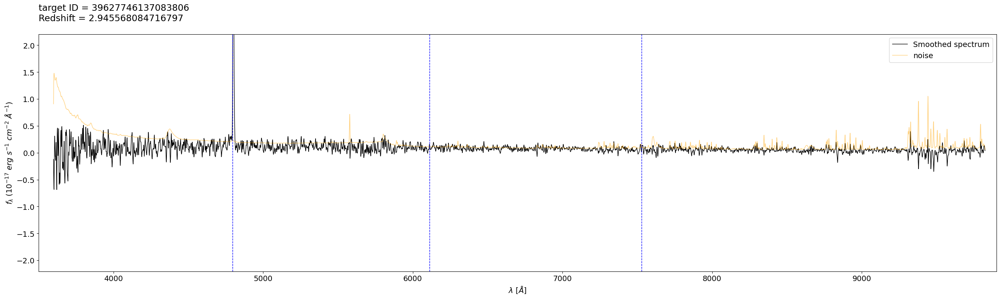

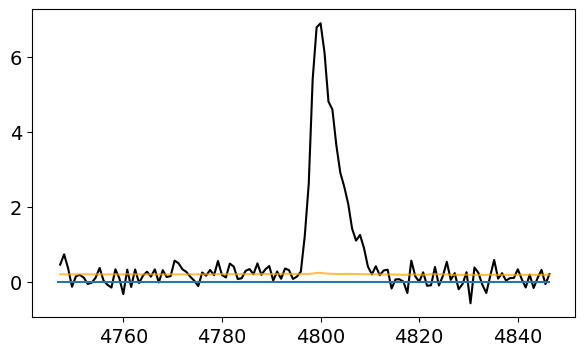

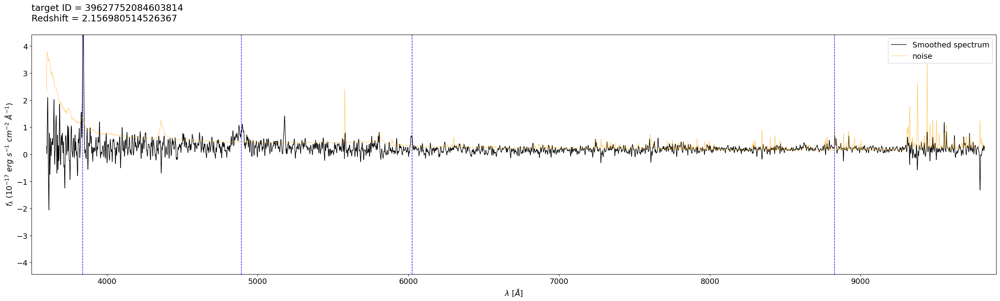

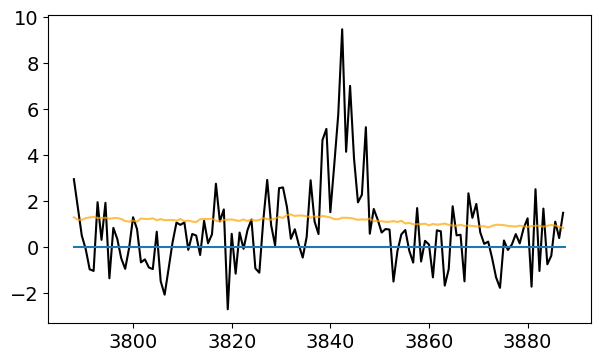

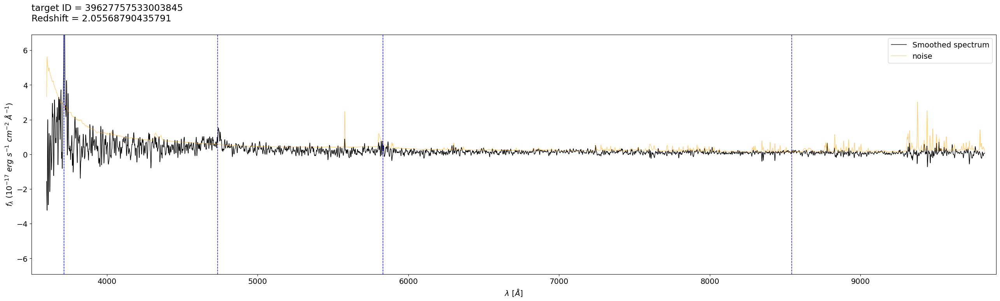

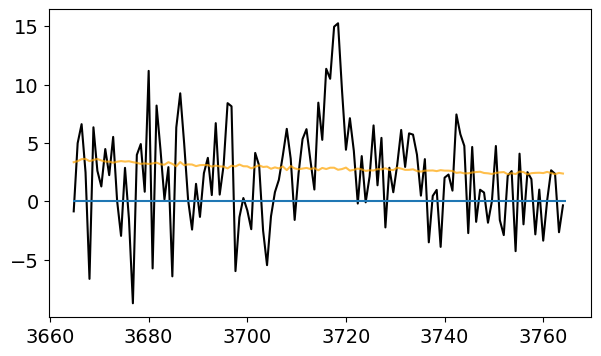

/tmp/ipykernel_1132197/3735248796.py:31: RuntimeWarning: divide by zero encountered in reciprocal
  iv = np.sqrt(ivar) ** -1


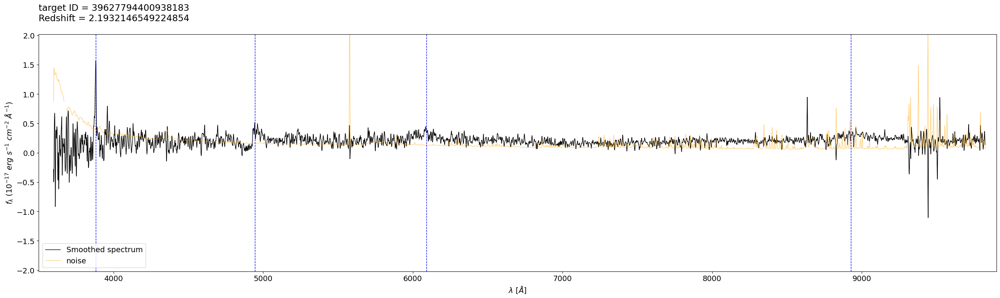

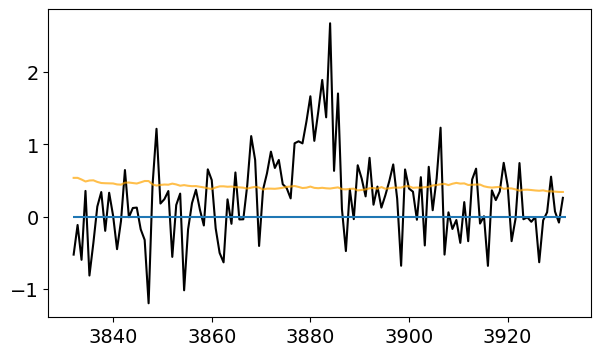

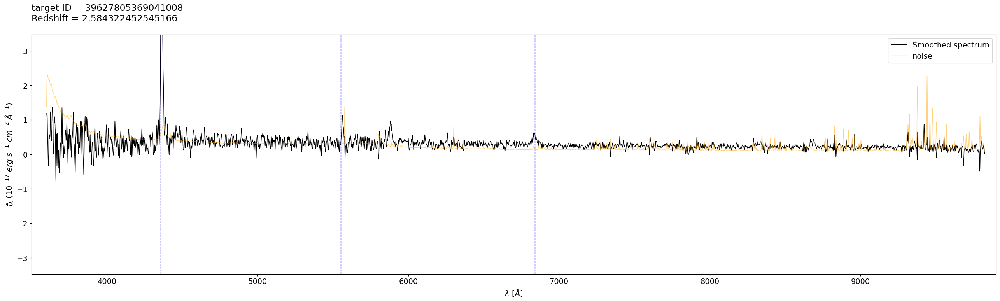

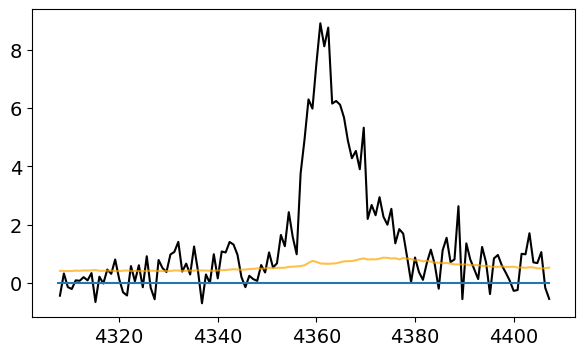

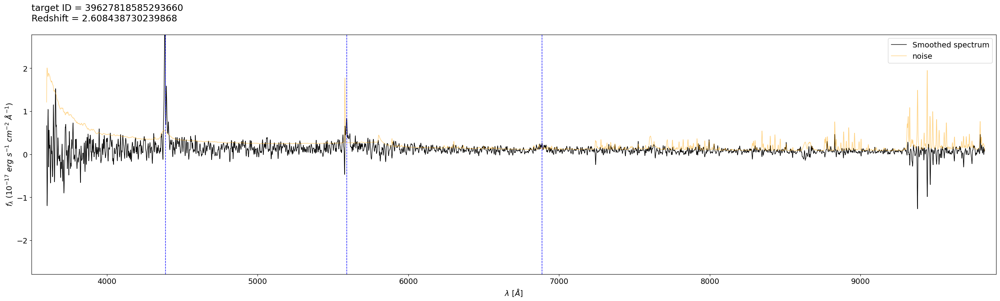

...

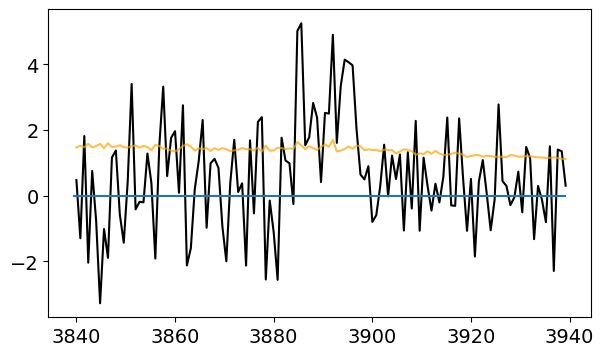

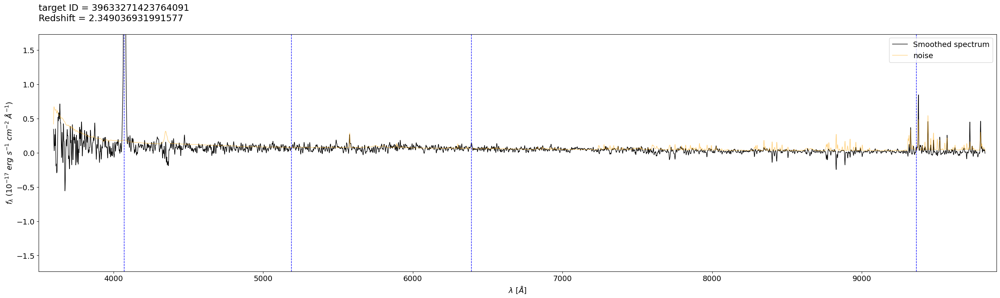

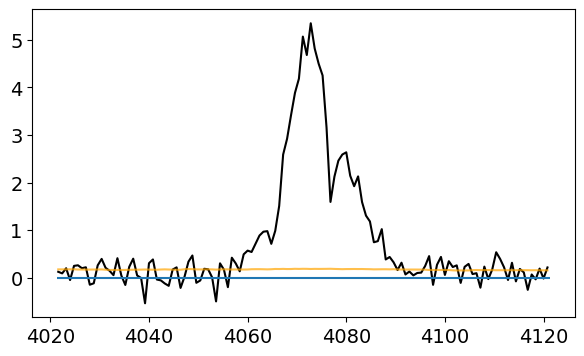

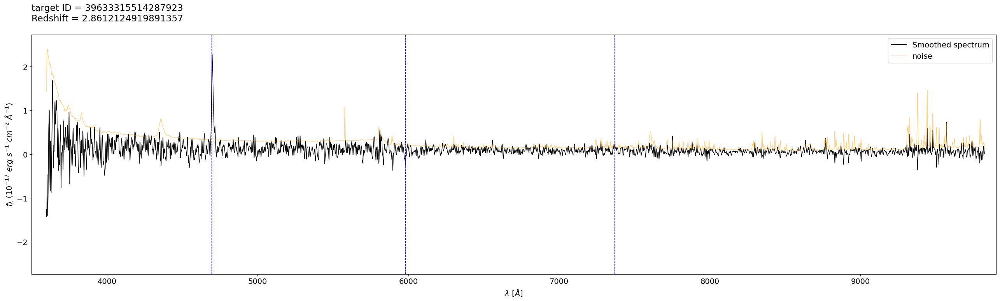

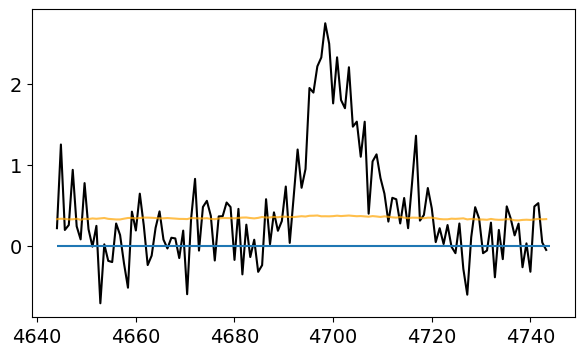

In [ ]:
a = [39632935074138110, 39633154004224351, 39627818585293660, 39627770237553736, 39627793775987580, 39628512604197125, 39628162799243794, 39627788369532055, 39633321159821885, 39628251261307328, 39633445449630004, 39633328080423382, 39632935820725527, 39628522129457539, 39627794400938183, 39633443457336335, 39632940803557436, 39628502093269039, 39628522108485983, 39633448880573839, 39633158248859282, 39632966401395824, 39628518048402966, 39627817930983353, 39633136476229222, 39627757533003845, 39633446330433596, 39633158332744292, 39633140934773940, 39633446347212406, 39633461127939003, 39628346077744476, 39633149570844137, 39627865767020173, 39633399110962097, 39628449249234136, 39628526722224222, 39632982209728995, 39627872939282349, 39628340558038492, 39627767259599599, 39628501803860396, 39627811903766662, 39628522578249928, 39627896905532168, 39633396141393095, 39627800436540415, 39633140985102888, 39633447999767630, 39632981865794700, 39627921022779679, 39633390181287359, 39632981857407157, 39633321830908614, 39633319003947123, 39628438604087799, 39632961410171007, 39627758111822533, 39627752084603814, 39633315514287923, 39632956372812932, 39633329380659204, 39633399123544121, 39628523010264700, 39628516454565699, 39633308404942324, 39633145309431855, 39628465141452092, 39627847651821744, 39633271423764091, 39632940061164146, 39627805369041008, 39627902802727149, 39627746137083806, 39633145263293789, 39628521533867882, 39633399094183117, 39628517322790831, 39633419147150113, 39633132135121316, 39632930028390069, 39628516567811138]
plot_spectra(spectra = spectra, TARGETID = a)

In [ ]:
labels = inspector(label_path = "/pscratch/sd/j/juikuan/DESI_LAE_dataset/VI/fuji_pre.pkl", spectra = spectra, TARGETID = 39633154004224351)

In [ ]:
labels = inspector(spectra = spectra, label_path = "/pscratch/sd/j/juikuan/DESI_LAE_dataset/VI/iron_pre.pkl")

In [ ]:
n = 0
for i in spectra[::-1]:
    n += 1
    flux = i["FLUX"]
    wavelength = i["WAVE"]
    redshift = i["Z"]
    ivar = i["IVAR"]
    targetid = i["TARGETID"]

    if redshift > 1.96:
        vlines = np.array([1215.67, 1549, 1908, 2796]) * (redshift  + 1)
        #Lya, CIV, CIII, and MGII

    elif redshift < 0.4:
        vlines = np.array([3726.032, 3968.47, 4101.734, 4340, 4861, 5007, 4959, 6562.81]) * (redshift  + 1)
        #OII, HEPSILON, HDELTA, HGAMMA, HBETA, OIII, and HALPHA
    else:
        pass

    vlines = vlines[vlines < wavelength[-1]]
    vlines = vlines[vlines > wavelength[0]]

    w = wavelength
    f = flux
    iv = np.sqrt(ivar) ** -1

#     plt.close()
#     plt.rcParams['figure.figsize'] = (32,8)
#     plt.title(f"target ID = {targetid}\n"
#               f"Redshift = {redshift}\n", loc = 'left')
#     plt.plot(w, convolve(f, Gaussian1DKernel(2)), color = 'k', label = 'Smoothed spectrum', lw = 1)
#     plt.plot(w, convolve(iv, Gaussian1DKernel(2)), color = 'orange', alpha = 0.5, label = 'noise', lw = 1)
#     ymax = np.std(f, ddof = 1) * 7
#     ymin = -np.std(f, ddof = 1) * 7
#     plt.xlim(3500, 9900)
#     plt.ylim(ymin, ymax)

#     for j in vlines:
#         plt.vlines(x = j, ymin = ymin, ymax = ymax, color = "b", linestyles = "dashed", lw = 1)

#     plt.legend()
#     plt.savefig(f"/pscratch/sd/j/juikuan/DESI_LAE_dataset/original_dataset/iron_pre_spectra/{targetid}.png", bbox_inches='tight')

    if redshift < 0.4:
        mask_min = wavelength > 3726.032 * (redshift + 1) - 50
        mask_max = wavelength < 3726.032 * (redshift + 1) + 50
        w = wavelength[mask_min & mask_max]
        f = flux[mask_min & mask_max]
        iv = np.sqrt(ivar[mask_min & mask_max]) ** -1

        if np.max(f) == np.inf:
            f[np.where(f == np.inf)] = np.median(f)
        elif np.max(iv) == np.inf:
            iv[np.where(iv == np.inf)] = np.median(iv)
        else:
            pass
        plt.close()
        plt.rcParams['figure.figsize'] = (7, 4)
        plt.plot(w, f, color = 'k', alpha = 1, label = 'Unsmoothed spectrum')
        plt.plot(w, iv, color = 'orange', alpha = 0.7, label = 'noise')
        plt.hlines(y = 0, xmin = 3726.032 * (redshift + 1) - 50, xmax = 3726.032 * (redshift + 1) + 50)
        plt.savefig(f"/pscratch/sd/j/juikuan/DESI_LAE_dataset/original_dataset/iron_pre_spectra/{targetid}_s.png", bbox_inches='tight')

    elif redshift > 1.96:
        mask_min = wavelength > 1215.67 * (redshift + 1) - 50
        mask_max = wavelength < 1215.67 * (redshift + 1) + 50
        w = wavelength[mask_min & mask_max]
        f = flux[mask_min & mask_max]
        iv = np.sqrt(ivar[mask_min & mask_max]) ** -1

        if np.max(f) == np.inf:
            f[np.where(f == np.inf)] = np.median(f)
        elif np.max(iv) == np.inf:
            iv[np.where(iv == np.inf)] = np.median(iv)
        else:
            pass
        plt.close()
        plt.rcParams['figure.figsize'] = (7,4)
        plt.plot(w, f, color = 'k', alpha = 1, label = 'Unsmoothed spectrum')
        plt.plot(w, iv, color = 'orange', alpha = 0.7, label = 'noise')
        plt.hlines(y = 0, xmin = 1215.67 * (redshift + 1) - 50, xmax = 1215.67 * (redshift + 1) + 50)
        plt.savefig(f"/pscratch/sd/j/juikuan/DESI_LAE_dataset/original_dataset/iron_pre_spectra/{targetid}_s.png", bbox_inches='tight')
    if n == 1401:
        break

In [ ]:
def prospect_VI(spectra, html_dir):
    a = viewer.plotspectra(spectra = spectra, html_dir = html_dir)
    return a

In [ ]:
a = prospect_VI(spectra = spectra[0]["SPECTRUM"], html_dir = "../DESI_LAE_dataset/")